In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()

In [2]:
wfh_df = pd.read_csv('E:/Project 5 credits/Final Project/workfromhome.csv',  sep='\t')

In [3]:
wfh_df.head()

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1333198955249872904,1333162629448208386,2020-11-30 05:29:35 Sri Lanka Standard Time,2020-11-30,05:29:35,530,30854675,lizcurran,Liz Curran,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'stu_fraser', 'name': 'Stuart...",NaN,NaN,NaN,NaN
1,1333198951164616706,1333198951164616706,2020-11-30 05:29:34 Sri Lanka Standard Time,2020-11-30,05:29:34,530,321488738,smorgridge,Sally Morgridge,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
2,1333198916171538432,1333192884846256130,2020-11-30 05:29:25 Sri Lanka Standard Time,2020-11-30,05:29:25,530,844626745500274690,cobblepott__,"cobblepott, Source Code Vigilante",NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,1333198851461820423,1333198851461820423,2020-11-30 05:29:10 Sri Lanka Standard Time,2020-11-30,05:29:10,530,350351173,areal_superb,Ariel Ovalle,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,1333198785678249986,1333198785678249986,2020-11-30 05:28:54 Sri Lanka Standard Time,2020-11-30,05:28:54,530,889006510293958656,recyclersrealm2,Recyclersrealm2#YGAK⬇️#Jusice4Vicha#2kQMO. UBI💜,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN


In [4]:
wfh_df.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89312 entries, 0 to 89311
Data columns (total 36 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               89312 non-null  int64  
 1   conversation_id  89312 non-null  int64  
 2   created_at       89312 non-null  object 
 3   date             89312 non-null  object 
 4   time             89312 non-null  object 
 5   timezone         89312 non-null  int64  
 6   user_id          89312 non-null  int64  
 7   username         89312 non-null  object 
 8   name             89301 non-null  object 
 9   place            100 non-null    object 
 10  tweet            89312 non-null  object 
 11  language         89312 non-null  object 
 12  mentions         89312 non-null  object 
 13  urls             89312 non-null  object 
 14  photos           89312 non-null  object 
 15  replies_count    89312 non-null  int64  
 16  retweets_count   89312 non-null  int64  
 17  likes_count 

In [5]:
wfh_df.dtypes

id                   int64
conversation_id      int64
created_at          object
date                object
time                object
timezone             int64
user_id              int64
username            object
name                object
place               object
tweet               object
language            object
mentions            object
urls                object
photos              object
replies_count        int64
retweets_count       int64
likes_count          int64
hashtags            object
cashtags            object
link                object
retweet               bool
quote_url           object
video                int64
thumbnail           object
near               float64
geo                float64
source             float64
user_rt_id         float64
user_rt            float64
retweet_id         float64
reply_to            object
retweet_date       float64
translate          float64
trans_src          float64
trans_dest         float64
dtype: object

<AxesSubplot:>

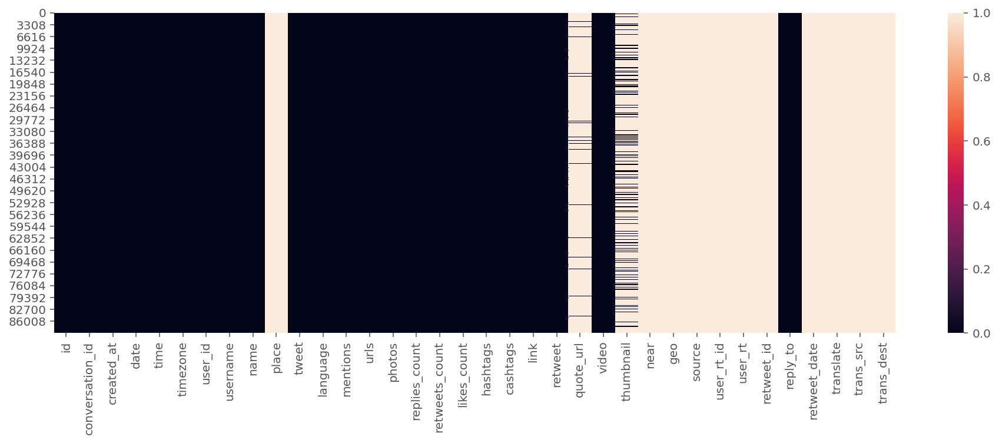

In [6]:
# check for null value in data
plt.figure(figsize = (16,5))
sns.heatmap(wfh_df.isnull())

In [7]:
import plotly.express as px

missed = pd.DataFrame()
missed['column'] = wfh_df.columns

missed['percent'] = [round(100* wfh_df[col].isnull().sum() / len(wfh_df), 2) for col in wfh_df.columns]
missed = missed.sort_values('percent')
missed = missed[missed['percent']>0]

fig = px.bar(
    missed, 
    x='percent', 
    y="column", 
    orientation='h', 
    title='Missed values percent for every column (percent > 0)', 
    height=400, 
    width=600
)

fig.show()

In [8]:
wfh_df.corr()

,id,conversation_id,timezone,user_id,replies_count,retweets_count,likes_count,retweet,video,near,geo,source,user_rt_id,user_rt,retweet_id,retweet_date,translate,trans_src,trans_dest
id,1.000000,0.111168,NaN,0.063242,-0.005193,0.005824,0.004114,NaN,0.000966,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
conversation_id,0.111168,1.000000,NaN,-0.001525,-0.000606,0.001176,0.000874,NaN,0.006175,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
timezone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
user_id,0.063242,-0.001525,NaN,1.000000,-0.003265,0.003320,0.003218,NaN,0.032218,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
replies_count,-0.005193,-0.000606,NaN,-0.003265,1.000000,0.476199,0.346299,NaN,-0.000838,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweets_count,0.005824,0.001176,NaN,0.003320,0.476199,1.000000,0.861456,NaN,0.002341,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
likes_count,0.004114,0.000874,NaN,0.003218,0.346299,0.861456,1.000000,NaN,0.002693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
video,0.000966,0.006175,NaN,0.032218,-0.000838,0.002341,0.002693,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
near,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0.5, 1.0, 'Correlation Heatmap')

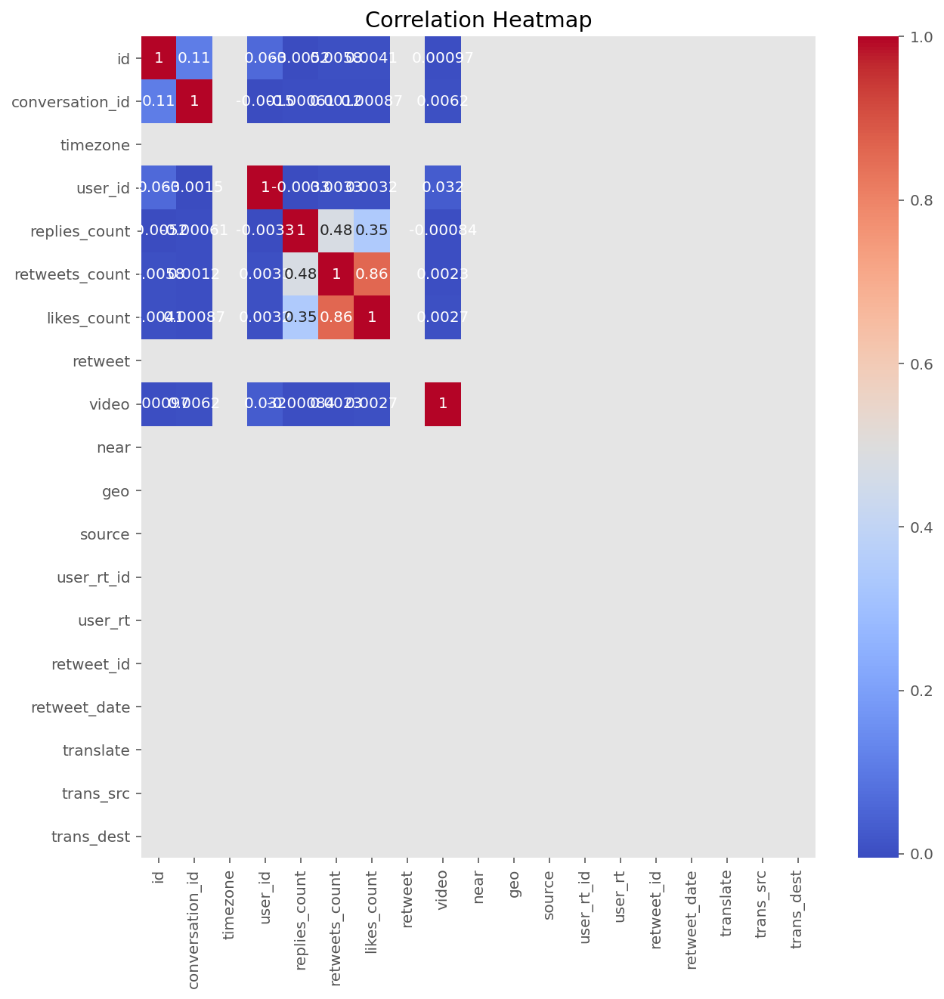

In [9]:
plt.figure(figsize=(10,10))
sns.heatmap(wfh_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap')

In [10]:
df_new = wfh_df['username'].value_counts().reset_index()
df_new.columns = ['username', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="username", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [11]:
df_new.tail(10)

,username,tweets_count
9,remotejobsvault,123
8,grahampaul096,123
7,workremoteft,131
6,remoteio_jobs,133
5,pm_results,140
4,bmurphypointman,156
3,dranthony,160
2,clinicalclasses,291
1,kokoshungsan,303
0,247work,3086


In [12]:
wfh_df= pd.merge(wfh_df, df_new, on='username')

In [13]:
wfh_df.drop(['hashtags','cashtags','thumbnail','source','user_rt','retweet_id','reply_to','retweet_date','translate','trans_src','trans_dest', 'timezone', 'name', 'created_at', 'user_id', 'place', 'likes_count', 'link', 'retweet', 'quote_url', 'video', 'user_rt_id', 'near', 'geo', 'mentions', 'urls', 'photos', 'replies_count', 'retweets_count','conversation_id'], axis = 1, inplace = True)
wfh_df.drop_duplicates()
wfh_df.head()

,id,date,time,username,tweet,language,tweets_count
0,1333198955249872904,2020-11-30,05:29:35,lizcurran,@stu_fraser Sadly I wasn’t on site for this on...,en,1
1,1333198951164616706,2020-11-30,05:29:34,smorgridge,"Back to work tomorrow, but this perfect doll b...",en,1
2,1333198916171538432,2020-11-30,05:29:25,cobblepott__,@CarlosDMarquez1 My wife does this often. When...,en,1
3,1333198851461820423,2020-11-30,05:29:10,areal_superb,Came home from work and my wife put the Christ...,en,2
4,1333160257372217345,2020-11-30,02:55:48,areal_superb,@StevenASnow First episode was great. I want t...,en,2


In [14]:
wfh_df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89312 entries, 0 to 89311
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            89312 non-null  int64 
 1   date          89312 non-null  object
 2   time          89312 non-null  object
 3   username      89312 non-null  object
 4   tweet         89312 non-null  object
 5   language      89312 non-null  object
 6   tweets_count  89312 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 5.5+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [15]:
wfh_df.dtypes

id               int64
date            object
time            object
username        object
tweet           object
language        object
tweets_count     int64
dtype: object

<AxesSubplot:>

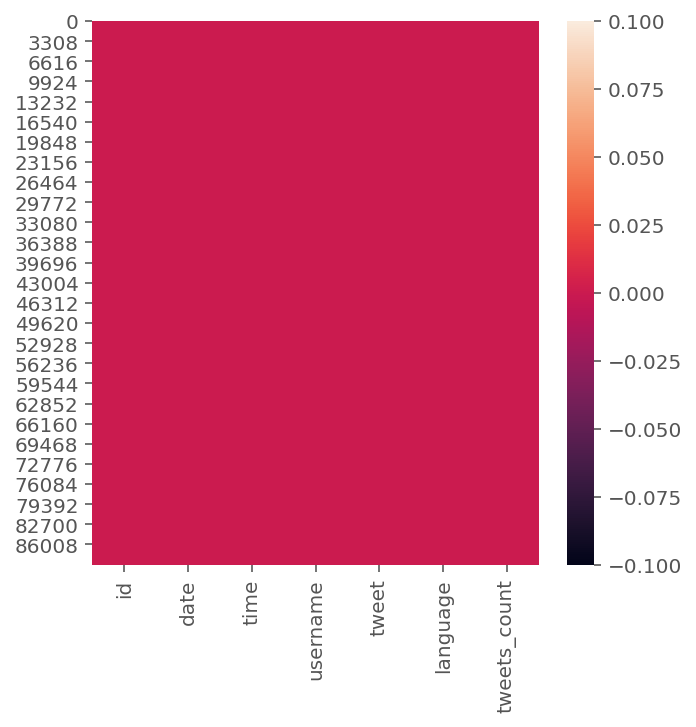

In [16]:
# check for null value in data
plt.figure(figsize = (5,5))
sns.heatmap(wfh_df.isnull())

Text(0.5, 1.0, 'Correlation Heatmap After Dropping Null Val')

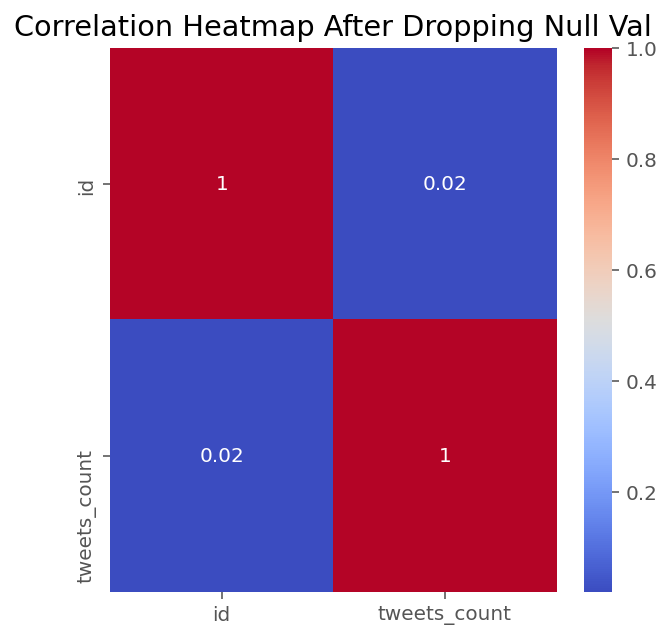

In [17]:
plt.figure(figsize=(5,5))
sns.heatmap(wfh_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap After Dropping Null Val')

In [18]:
df_english_only = wfh_df[wfh_df['language'] == 'en']
df_english_only.head()

,id,date,time,username,tweet,language,tweets_count
0,1333198955249872904,2020-11-30,05:29:35,lizcurran,@stu_fraser Sadly I wasn’t on site for this on...,en,1
1,1333198951164616706,2020-11-30,05:29:34,smorgridge,"Back to work tomorrow, but this perfect doll b...",en,1
2,1333198916171538432,2020-11-30,05:29:25,cobblepott__,@CarlosDMarquez1 My wife does this often. When...,en,1
3,1333198851461820423,2020-11-30,05:29:10,areal_superb,Came home from work and my wife put the Christ...,en,2
4,1333160257372217345,2020-11-30,02:55:48,areal_superb,@StevenASnow First episode was great. I want t...,en,2


In [19]:
df_english_only.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84111 entries, 0 to 89311
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            84111 non-null  int64 
 1   date          84111 non-null  object
 2   time          84111 non-null  object
 3   username      84111 non-null  object
 4   tweet         84111 non-null  object
 5   language      84111 non-null  object
 6   tweets_count  84111 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 5.1+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [20]:
wfh_df = pd.concat([df_english_only], ignore_index=True)

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [22]:
df_new = wfh_df[wfh_df['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                        id        date      time        username  \
0      1333198955249872904  2020-11-30  05:29:35       lizcurran   
1      1333198951164616706  2020-11-30  05:29:34      smorgridge   
2      1333198916171538432  2020-11-30  05:29:25    cobblepott__   
3      1333198851461820423  2020-11-30  05:29:10    areal_superb   
4      1333160257372217345  2020-11-30  02:55:48    areal_superb   
...                    ...         ...       ...             ...   
84106  1329394334303744003  2020-11-19  17:31:22   shadowfaxtech   
84107  1329394294764040194  2020-11-19  17:31:13       p_i_a_n_0   
84108  1329394211716800516  2020-11-19  17:30:53       brawbrave   
84109  1329394201134510080  2020-11-19  17:30:51          ltcobi   
84110  1329394194234953732  2020-11-19  17:30:49  thecountrygirl   

                                                   tweet language  \
0      @stu_fraser Sadly I wasn’t on site for this on...       en   
1      Back to work tomorrow, but this perfec

In [23]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [24]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1333198955249872904,2020-11-30,05:29:35,lizcurran,@stu_fraser Sadly I wasn’t on site for this on...,en,1,stu_fraser sadly i wasnt site one due work i k...,Negative
1,1333198951164616706,2020-11-30,05:29:34,smorgridge,"Back to work tomorrow, but this perfect doll b...",en,1,back work tomorrow perfect doll baby hanging d...,Positive
2,1333198916171538432,2020-11-30,05:29:25,cobblepott__,@CarlosDMarquez1 My wife does this often. When...,en,1,carlosdmarquez my wife often whenever i come h...,Neutral
3,1333198851461820423,2020-11-30,05:29:10,areal_superb,Came home from work and my wife put the Christ...,en,2,came home work wife put christmas tree help gi...,Positive
4,1333160257372217345,2020-11-30,02:55:48,areal_superb,@StevenASnow First episode was great. I want t...,en,2,stevenasnow first episode great i want watch a...,Positive


(-0.5, 399.5, 199.5, -0.5)

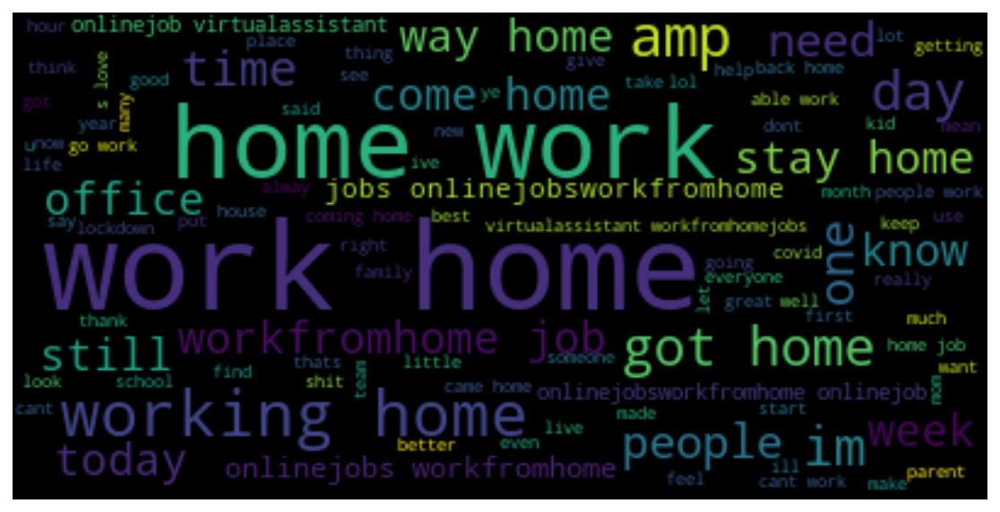

In [25]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [26]:
df_new['text']

0        stu_fraser sadly i wasnt site one due work i k...
1        back work tomorrow perfect doll baby hanging d...
2        carlosdmarquez my wife often whenever i come h...
3        came home work wife put christmas tree help gi...
4        stevenasnow first episode great i want watch a...
                               ...                        
84106    are teams able work securely home shadowfax si...
84107    thecryptodog work from home with your phone la...
84108    learn to podcast whether fancy starting passio...
84109    roseinharlem omg i attitude driving home work ...
84110    skyhelpteam internet since i need work home i ...
Name: text, Length: 84111, dtype: object

In [27]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,43473
1,Neutral,21779
0,Negative,18859


<AxesSubplot:xlabel='sentiment', ylabel='count'>

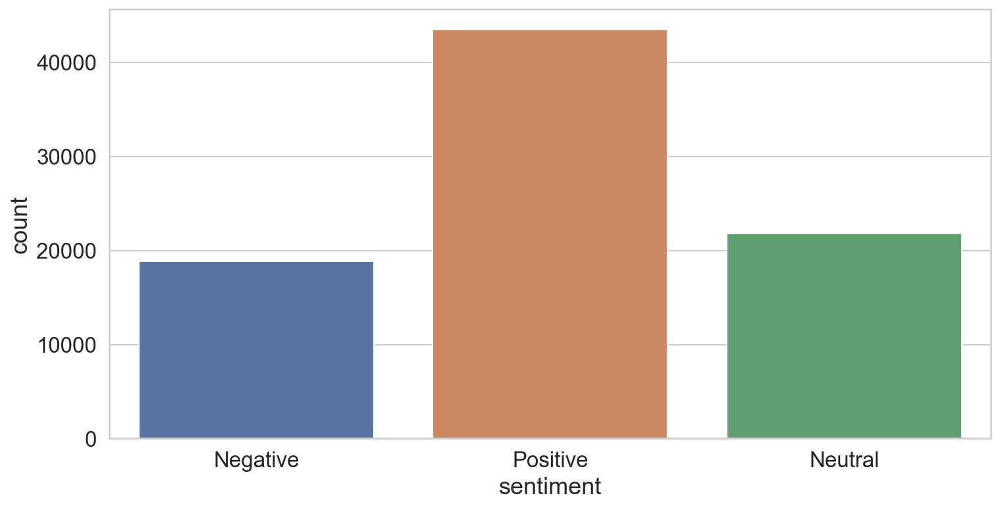

In [28]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [29]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

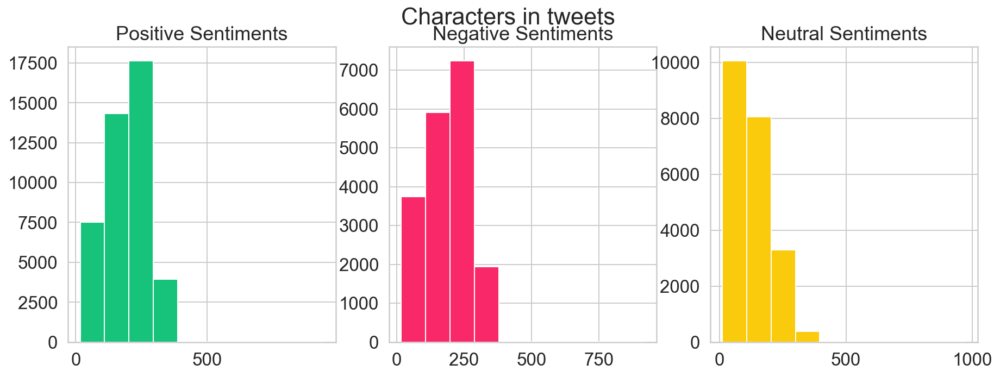

In [30]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

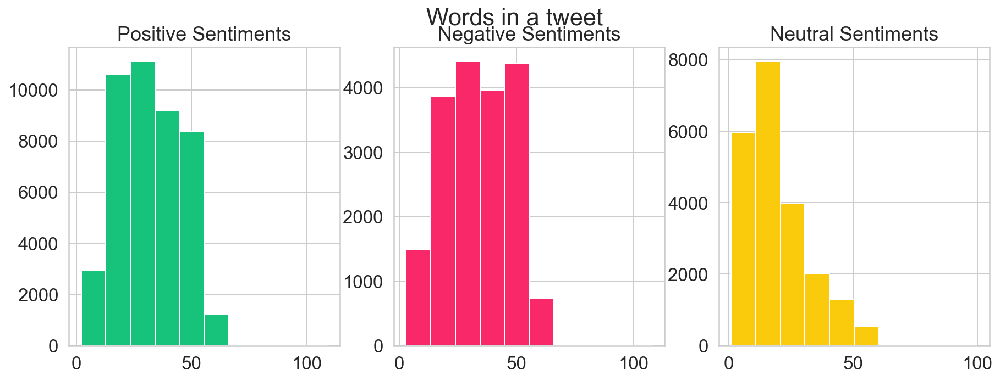

In [31]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

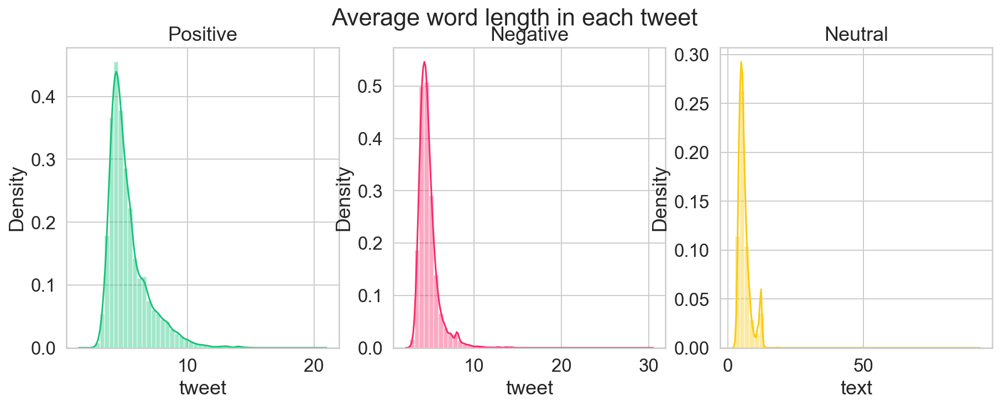

In [32]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [33]:
def create_corpus(target):
    corpus=[]
    
    for x in df_new[df_new['sentiment']==target ]['text'].str.split():
        for i in x:
            corpus.append(i)
    return corpus

In [34]:
np.array(stopwords)

array({'between', 'doesn', 'below', 'will', "you're", "hasn't", 'only', 'are', "wasn't", 'when', 'him', 'if', 'his', 'while', 'for', 'your', 'again', "weren't", 'needn', 'then', 'off', 'own', 'is', "couldn't", 'our', 'nor', 'they', 'which', 'so', 'theirs', 'some', 'shouldn', 'or', 't', 'hadn', 'on', 'what', 'shan', "that'll", 'y', 'doing', "didn't", "mightn't", "you'd", 'yourselves', "aren't", 'll', 'o', "needn't", 'herself', 'into', 'my', 'she', 'no', 'weren', 'all', 'can', 'having', 'he', 'those', 'the', 'has', 'mustn', 'her', 'through', 'further', 'of', 'himself', 'i', 'myself', 'there', 'couldn', 'yours', 'won', 're', 'isn', "won't", "mustn't", 'were', 'wasn', 'why', 'from', 'mightn', 'here', 'before', 'during', 'we', "hadn't", 'just', 'up', 'where', 'have', 'an', 'ours', 'hasn', "you've", 'themselves', 'each', 'you', "should've", 'because', 've', 'too', 'am', 'does', 'any', 'wouldn', 'above', "don't", 'had', 'yourself', 'and', 'at', 'against', 'under', "doesn't", 'haven', 'now', '

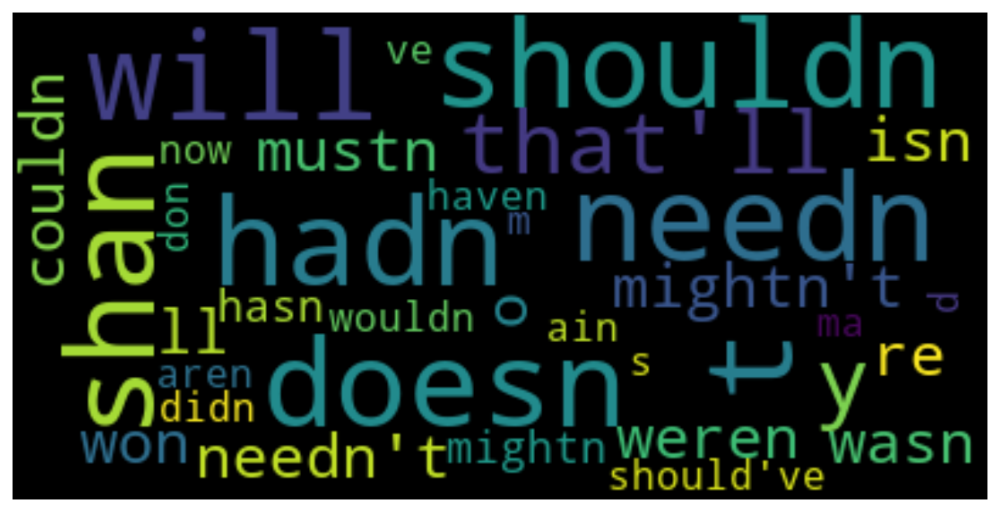

In [35]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 

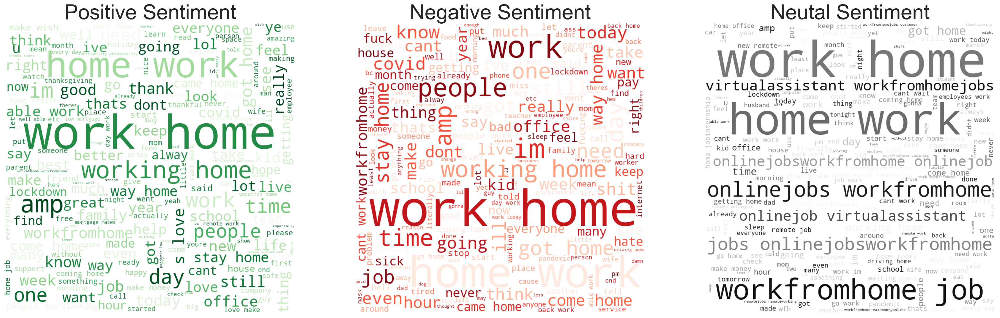

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [37]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

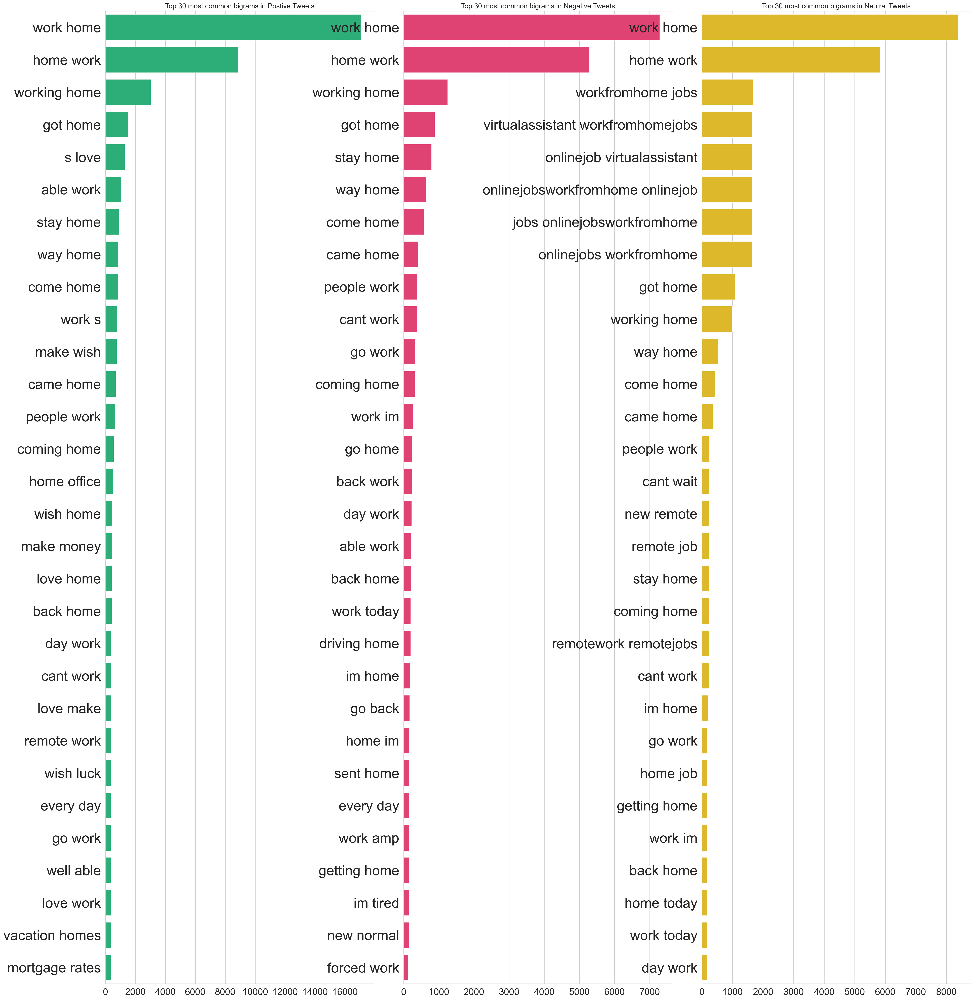

In [38]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

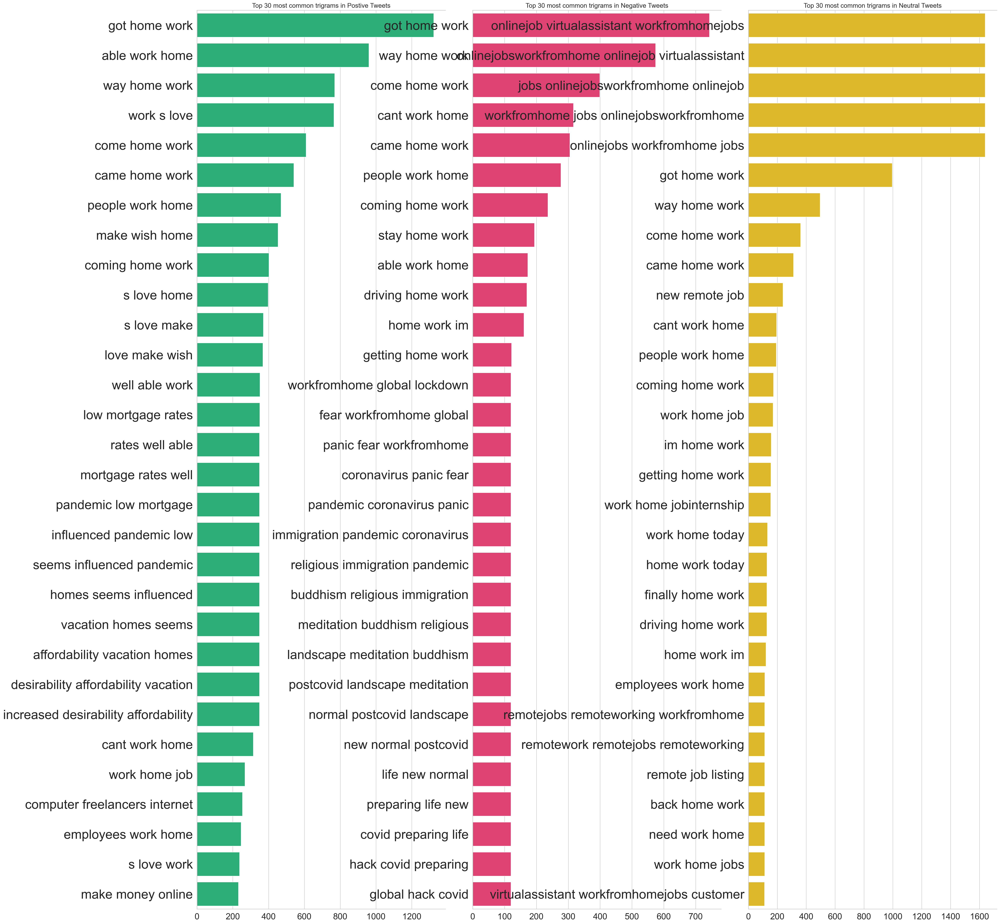

In [39]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [40]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1333198955249872904,2020-11-30,05:29:35,lizcurran,@stu_fraser Sadly I wasn’t on site for this on...,en,1,stu_fraser sadly i wasnt site one due work i k...,Negative
1,1333198951164616706,2020-11-30,05:29:34,smorgridge,"Back to work tomorrow, but this perfect doll b...",en,1,back work tomorrow perfect doll baby hanging d...,Positive
2,1333198916171538432,2020-11-30,05:29:25,cobblepott__,@CarlosDMarquez1 My wife does this often. When...,en,1,carlosdmarquez my wife often whenever i come h...,Neutral
3,1333198851461820423,2020-11-30,05:29:10,areal_superb,Came home from work and my wife put the Christ...,en,2,came home work wife put christmas tree help gi...,Positive
4,1333160257372217345,2020-11-30,02:55:48,areal_superb,@StevenASnow First episode was great. I want t...,en,2,stevenasnow first episode great i want watch a...,Positive


In [41]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [42]:
df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1332486146165780480,2020-11-28,06:17:08,aezreil,@maegutz @mac_gardiner12 I feel bad being sad ...,en,1,maegutz mac_gardiner i feel bad sad holidays w...,Negative
1,1331882602911965185,2020-11-26,14:18:52,sojuicyhesnluv,I got home at 1am from work...started cooking....,en,1,i got home am workstarted cookingstill cooking,Neutral
2,1330805790433832965,2020-11-23,15:00:00,rchtwecare,Work from home if you can. If you cannot wor...,en,1,work home can if cannot work home continue go ...,Negative
3,1330615505842008067,2020-11-23,02:23:52,affiliatetiki,Find #avatrads on our affiliate website https...,en,3,find avatrads affiliate website zoom covid zoo...,Positive
4,1332885055182606336,2020-11-29,08:42:15,aamnnajjavvedd,@fizzamemonn It's the life of minimalism and ...,en,1,fizzamemonn its life minimalism simplicity mig...,Negative


In [43]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,39312
0,Negative,18174
1,Neutral,18061


<AxesSubplot:xlabel='sentiment', ylabel='count'>

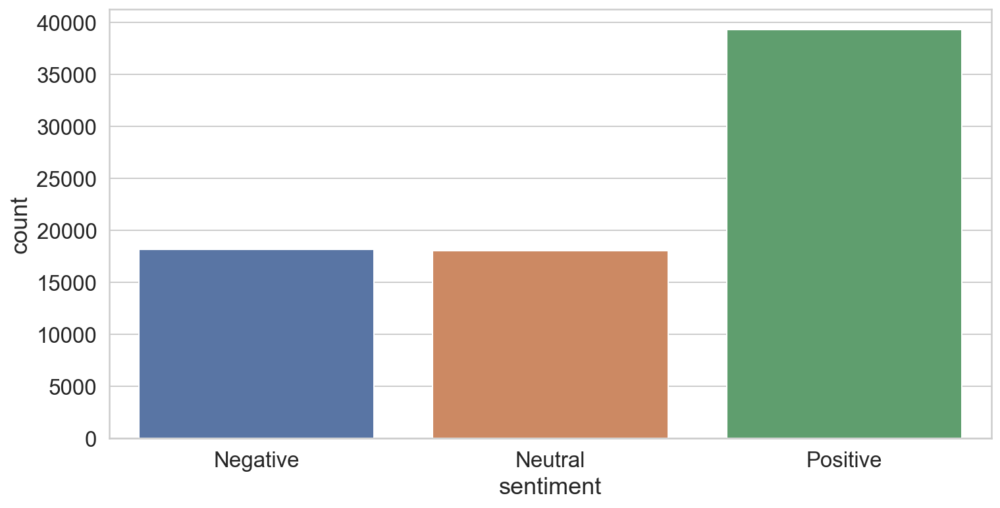

In [44]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [45]:
print(df_new)

                        id        date      time        username  \
0      1332486146165780480  2020-11-28  06:17:08         aezreil   
1      1331882602911965185  2020-11-26  14:18:52  sojuicyhesnluv   
2      1330805790433832965  2020-11-23  15:00:00      rchtwecare   
3      1330615505842008067  2020-11-23  02:23:52   affiliatetiki   
4      1332885055182606336  2020-11-29  08:42:15  aamnnajjavvedd   
...                    ...         ...       ...             ...   
75542  1331834437445713920  2020-11-26  11:07:28         _zulyyy   
75543  1329948473588928519  2020-11-21  06:13:20        gary_srp   
75544  1331199858380840963  2020-11-24  17:05:53    ur_realdaddy   
75545  1331052274324549633  2020-11-24  07:19:26    edgewalker81   
75546  1331579434344665091  2020-11-25  18:14:11      si1verhawk   

                                                   tweet language  \
0      @maegutz @mac_gardiner12 I feel bad being sad ...       en   
1      I got home at 1am from work...started 

In [46]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [47]:
len(df_new_final)

40000

In [48]:
export_csv = df_new_final.to_csv(r'work from home.csv')